In [36]:
import os
import glob
import cv2
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt

PROJECT = '/home/jovyan/aiffel/portrait_mode'

IMG_DIR = os.path.join(PROJECT, 'images')
OUT_DIR = os.path.join(PROJECT, 'results')
os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(OUT_DIR, exist_ok=True)
os.chdir(PROJECT)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plt.rcParams['figure.dpi'] = 110

print('작업 폴더:', os.getcwd())
print('OpenCV', cv2.__version__, '| Torch', torch.__version__, '|', DEVICE)
print('\nimages 폴더:')
for p in sorted(glob.glob(os.path.join(IMG_DIR, '*'))):
    print('  ', os.path.basename(p), f'({os.path.getsize(p)/1024:.0f} KB)')

작업 폴더: /home/jovyan/aiffel/portrait_mode
OpenCV 5.0.0 | Torch 2.7.1+cpu | cpu

images 폴더:
   강아지 사진.jpg (2896 KB)
   배경 사진.jpg (1399 KB)
   인물 사진.jpeg (91 KB)


In [37]:
def find(keyword):
    hits = [p for p in glob.glob(os.path.join(IMG_DIR, '*')) if keyword in os.path.basename(p)]
    if not hits:
        raise FileNotFoundError(f"'{keyword}' 없음. 폴더 내용: {os.listdir(IMG_DIR)}")
    return hits[0]

def read_rgb(path, max_side=1400):
    buf = np.fromfile(path, dtype=np.uint8)          # 한글 경로 대응
    bgr = cv2.imdecode(buf, cv2.IMREAD_COLOR)
    if bgr is None:
        raise ValueError('디코딩 실패: ' + path)
    h, w = bgr.shape[:2]
    if max(h, w) > max_side:
        s = max_side / max(h, w)
        bgr = cv2.resize(bgr, (int(w*s), int(h*s)), interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

def save_rgb(name, img):
    path = os.path.join(OUT_DIR, name)
    ok, buf = cv2.imencode('.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    if ok:
        buf.tofile(path)
        print('저장:', path)

def show(images, titles=None, cols=None, figsize=None):
    if not isinstance(images, (list, tuple)): images = [images]
    n = len(images); cols = cols or n; rows = int(np.ceil(n/cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize or (5.2*cols, 5*rows))
    axes = np.atleast_1d(axes).ravel()
    for i, ax in enumerate(axes):
        if i < n:
            ax.imshow(images[i], cmap='gray' if images[i].ndim == 2 else None)
            if titles: ax.set_title(titles[i], fontsize=11)
        ax.axis('off')
    plt.tight_layout(); plt.show()

인물  : (625, 612, 3) 인물 사진.jpeg
강아지: (933, 1400, 3) 강아지 사진.jpg
배경  : (930, 1400, 3) 배경 사진.jpg


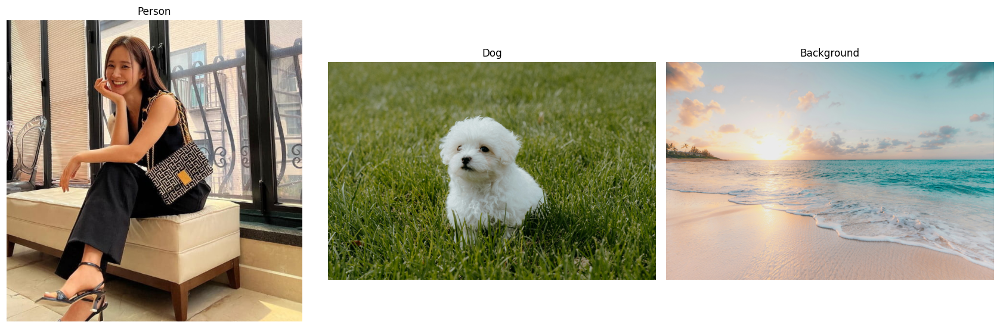

In [38]:
PERSON_PATH = find('인물')
DOG_PATH    = find('강아지')
BG_PATH     = find('배경')

person_img = read_rgb(PERSON_PATH)
dog_img    = read_rgb(DOG_PATH)
bg_img     = read_rgb(BG_PATH)

print('인물  :', person_img.shape, os.path.basename(PERSON_PATH))
print('강아지:', dog_img.shape, os.path.basename(DOG_PATH))
print('배경  :', bg_img.shape, os.path.basename(BG_PATH))

show([person_img, dog_img, bg_img], ['Person', 'Dog', 'Background'], cols=3)

In [39]:
VOC_CLASSES = ['background','aeroplane','bicycle','bird','boat','bottle','bus',
    'car','cat','chair','cow','diningtable','dog','horse','motorbike',
    'person','pottedplant','sheep','sofa','train','tvmonitor']
PERSON, CAT, DOG = 15, 8, 12

try:
    from torchvision.models.segmentation import DeepLabV3_ResNet101_Weights
    model = deeplabv3_resnet101(weights=DeepLabV3_ResNet101_Weights.DEFAULT)
except ImportError:
    model = deeplabv3_resnet101(pretrained=True)
model.eval().to(DEVICE)
print('모델 로드 완료')

모델 로드 완료


In [40]:
PREPROCESS = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

@torch.no_grad()
def segment(img_rgb, infer_side=800):
    h, w = img_rgb.shape[:2]
    s = min(1.0, infer_side / max(h, w))
    inp = cv2.resize(img_rgb, (int(w*s), int(h*s)), interpolation=cv2.INTER_AREA) if s < 1 else img_rgb
    x = PREPROCESS(inp).unsqueeze(0).to(DEVICE)
    seg = model(x)['out'][0].argmax(0).byte().cpu().numpy()
    if seg.shape != (h, w):
        seg = cv2.resize(seg, (w, h), interpolation=cv2.INTER_NEAREST)
    return seg

def class_mask(seg, ids):
    if isinstance(ids, int): ids = [ids]
    m = np.zeros(seg.shape, np.uint8)
    for c in ids: m |= (seg == c).astype(np.uint8)
    return m

def colorize(seg):
    p = np.random.RandomState(42).randint(0, 255, (21, 3)).astype(np.uint8)
    p[0] = 0
    return p[seg]

def detected_classes(seg):
    return [(VOC_CLASSES[c], int((seg == c).sum())) for c in np.unique(seg)]

In [41]:
def blur_background(img, mask, ksize=31):
    k = int(ksize) | 1
    return np.where(mask[:,:,None].astype(bool), img, cv2.GaussianBlur(img, (k,k), 0))

def fit_background(bg, h, w):
    bh, bw = bg.shape[:2]
    s = max(w/bw, h/bh)
    bg = cv2.resize(bg, (int(np.ceil(bw*s)), int(np.ceil(bh*s))), interpolation=cv2.INTER_AREA)
    y0, x0 = (bg.shape[0]-h)//2, (bg.shape[1]-w)//2
    return bg[y0:y0+h, x0:x0+w]

def replace_background(img, mask, bg):
    return np.where(mask[:,:,None].astype(bool), img, fit_background(bg, *img.shape[:2]))

[('background', 283574), ('chair', 13192), ('person', 85734)]


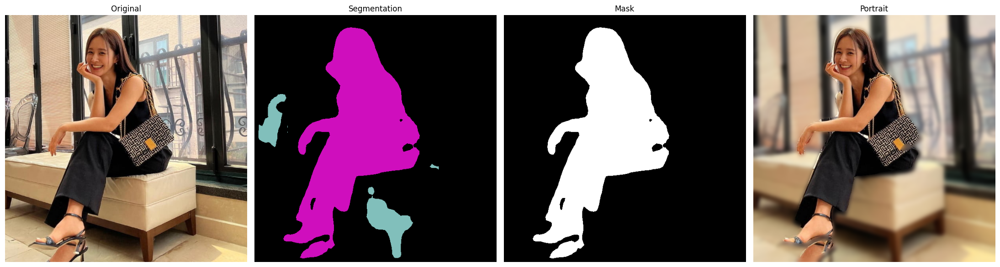

저장: /home/jovyan/aiffel/portrait_mode/results/01_person.jpg


In [42]:
person_seg = segment(person_img)
print(detected_classes(person_seg))

person_mask = class_mask(person_seg, PERSON)
person_out = blur_background(person_img, person_mask)

show([person_img, colorize(person_seg), person_mask*255, person_out],
     ['Original','Segmentation','Mask','Portrait'], cols=4, figsize=(20,5.5))
save_rgb('01_person.jpg', person_out)

[('background', 1135086), ('dog', 171114)]


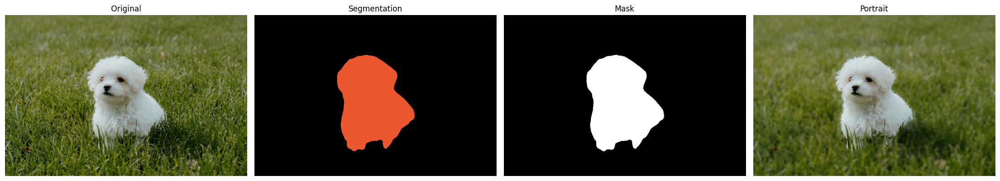

저장: /home/jovyan/aiffel/portrait_mode/results/02_dog.jpg


In [43]:
dog_seg = segment(dog_img)
print(detected_classes(dog_seg))

dog_mask = class_mask(dog_seg, [DOG, CAT])
if dog_mask.sum() == 0:
    print('경고: dog/cat 미검출 — 다른 사진을 쓰세요')

dog_out = blur_background(dog_img, dog_mask)
show([dog_img, colorize(dog_seg), dog_mask*255, dog_out],
     ['Original','Segmentation','Mask','Portrait'], cols=4, figsize=(20,5.5))
save_rgb('02_dog.jpg', dog_out)

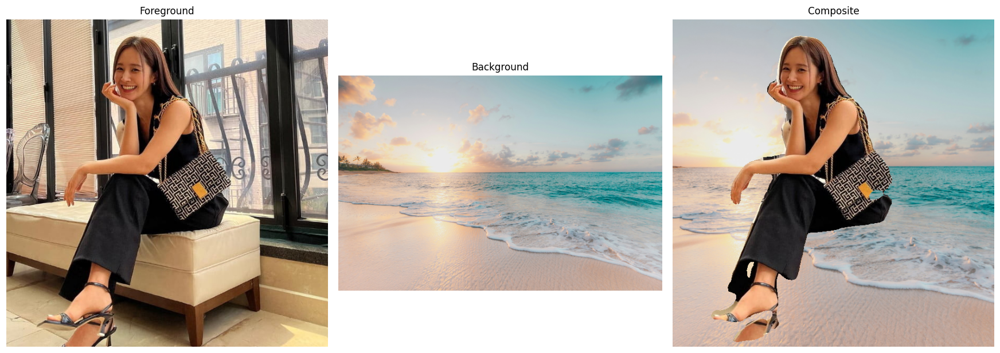

저장: /home/jovyan/aiffel/portrait_mode/results/03_chroma.jpg


In [44]:
chroma_out = replace_background(person_img, person_mask, bg_img)
show([person_img, bg_img, chroma_out], ['Foreground','Background','Composite'],
     cols=3, figsize=(16,5.5))
save_rgb('03_chroma.jpg', chroma_out)

In [45]:
def diagnose(img, mask, result, title=''):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    overlay = img.copy()
    cv2.drawContours(overlay, contours, -1, (255,0,0), max(2, img.shape[1]//400))
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,9))
    band = cv2.dilate(mask, k) - cv2.erode(mask, k)
    show([overlay, band*255, result], ['Mask boundary','Boundary band','Result'],
         cols=3, figsize=(16,5.5))
    n, _, stats, _ = cv2.connectedComponentsWithStats(mask, 8)
    print(f'{title} | 마스크 면적 {100*mask.mean():.1f}% | 연결요소 {n-1}개')
    if n > 1:
        print('덩어리 크기:', sorted(stats[1:, cv2.CC_STAT_AREA], reverse=True)[:5])

def grid(img, step=None):
    H, W = img.shape[:2]
    step = step or max(50, int(round(max(H,W)/12/50))*50)
    fig, ax = plt.subplots(figsize=(12, 12*H/W))
    ax.imshow(img)
    for x in range(0, W, step):
        ax.axvline(x, color='lime', lw=0.5, alpha=0.7); ax.text(x+2, 14, str(x), color='lime', fontsize=8)
    for y in range(0, H, step):
        ax.axhline(y, color='lime', lw=0.5, alpha=0.7); ax.text(2, y-3, str(y), color='lime', fontsize=8)
    ax.set_title(f'{W} x {H}, step={step}px'); plt.tight_layout(); plt.show()

def zoom(img, boxes, scale=2.0):
    H, W = img.shape[:2]; crops, titles = [], []
    for (x,y,w,h,label) in boxes:
        c = img[max(0,y):min(y+h,H), max(0,x):min(x+w,W)]
        if c.size:
            crops.append(cv2.resize(c, None, fx=scale, fy=scale, interpolation=cv2.INTER_NEAREST))
            titles.append(label)
    if crops: show(crops, titles, cols=min(3, len(crops)), figsize=(5*min(3,len(crops)), 5))

def annotate(img, boxes, title='', save_as=None):
    H, W = img.shape[:2]
    fig, ax = plt.subplots(figsize=(11, 11*H/W))
    ax.imshow(img); ax.axis('off')
    for i, (x,y,w,h,label) in enumerate(boxes, 1):
        ax.add_patch(plt.Rectangle((x,y), w, h, fill=False, edgecolor='red', linewidth=2.5))
        ax.text(x, max(y-6,14), f'{i}. {label}', color='white', fontsize=11, va='bottom',
                bbox=dict(facecolor='red', alpha=0.85, pad=2.5, edgecolor='none'))
    if title: ax.set_title(title, fontsize=13)
    plt.tight_layout()
    if save_as: fig.savefig(os.path.join(OUT_DIR, save_as), bbox_inches='tight', dpi=130)
    plt.show()

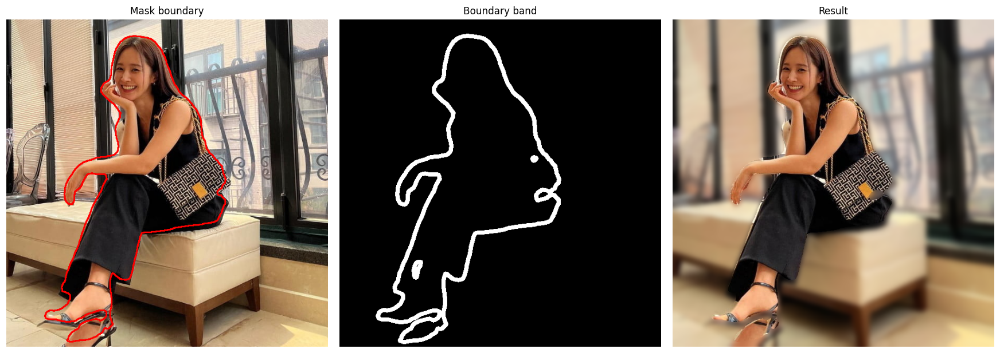

person | 마스크 면적 22.4% | 연결요소 1개
덩어리 크기: [np.int32(85734)]


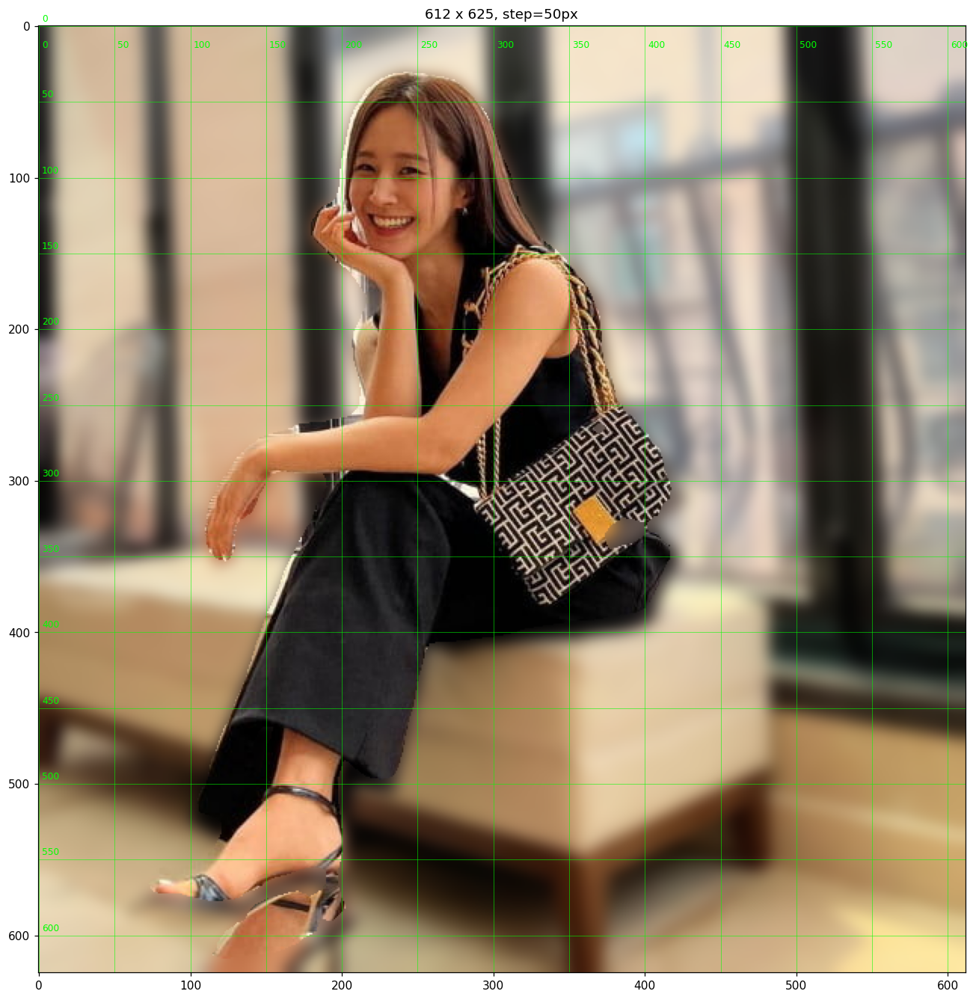

In [46]:
diagnose(person_img, person_mask, person_out, 'person')
grid(person_out)

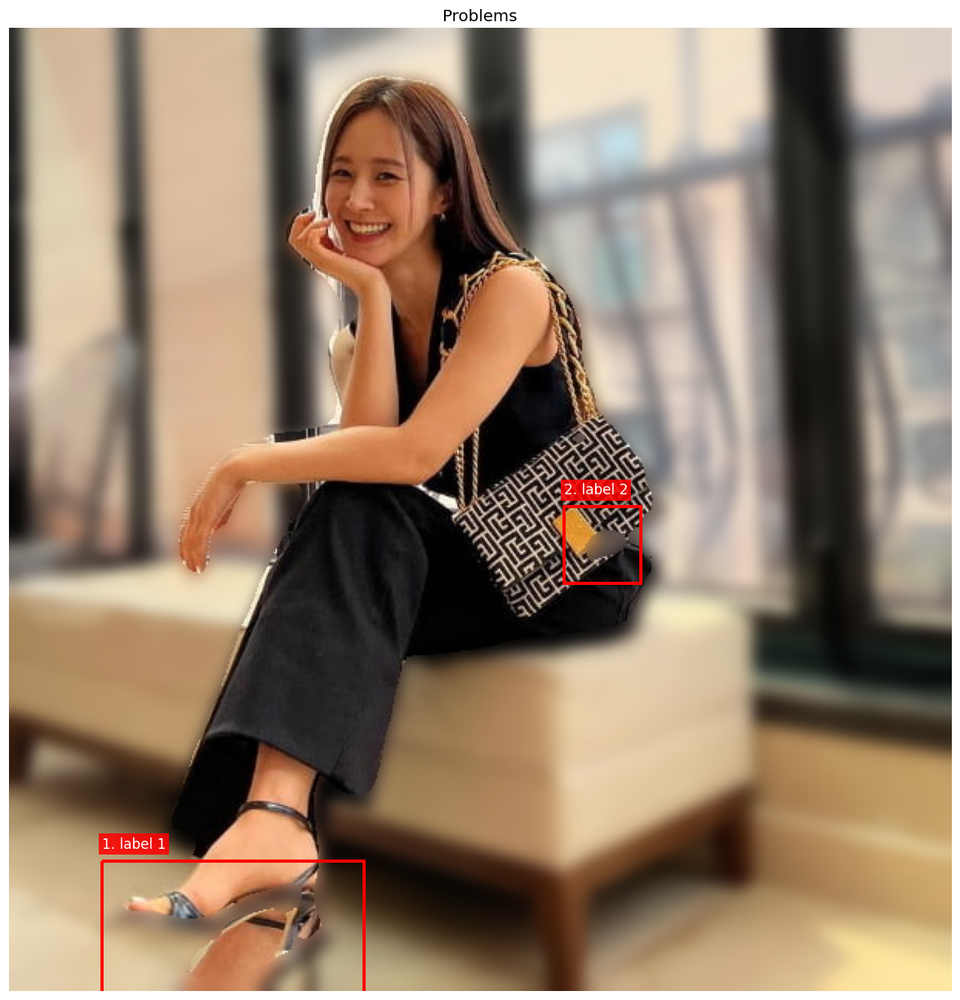

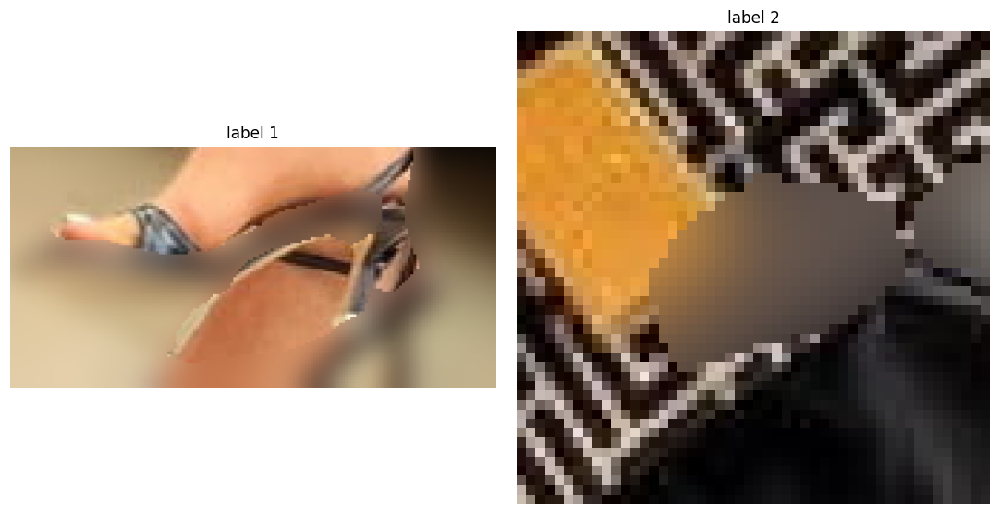

In [49]:
# 위 격자에서 좌표를 읽어 채우세요: (x, y, width, height, 라벨)
PROBLEM_BOXES = [
    (60, 540, 170, 100, 'label 1'),(360, 310, 50, 50, 'label 2')
]
annotate(person_out, PROBLEM_BOXES, 'Problems', save_as='04_problems.png')
zoom(person_out, PROBLEM_BOXES)

신발이 얇아서 신발까지 인물로 잘 잡지 못했고, 가방의 일부분을 제외해 버렸다.

In [50]:
def fill_holes(mask):
    h, w = mask.shape
    ff = mask.copy()
    if ff[0,0] == 1:
        ff = cv2.copyMakeBorder(ff, 1,1,1,1, cv2.BORDER_CONSTANT, value=0)
    pad = ff.shape[0] - h
    cv2.floodFill(ff, np.zeros((ff.shape[0]+2, ff.shape[1]+2), np.uint8), (0,0), 1)
    holes = (ff == 0).astype(np.uint8)
    if pad: holes = holes[1:-1, 1:-1]
    return (mask | holes).astype(np.uint8)

def clean_mask(mask, open_k=9, close_k=13, min_area_ratio=0.15):
    m = mask.astype(np.uint8)
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN,
                         cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_k, open_k)))
    n, lab, stats, _ = cv2.connectedComponentsWithStats(m, 8)
    if n > 1:
        areas = stats[1:, cv2.CC_STAT_AREA]
        thr = min_area_ratio * areas.max()
        keep = np.zeros_like(m); removed = 0
        for i in range(1, n):
            if stats[i, cv2.CC_STAT_AREA] >= thr: keep |= (lab == i).astype(np.uint8)
            else: removed += 1
        print(f'  오검출 덩어리 {removed}개 제거')
        m = keep
    m = cv2.morphologyEx(m, cv2.MORPH_CLOSE,
                         cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_k, close_k)))
    return fill_holes(m)

In [51]:
def guided_filter(guide, src, radius=24, eps=1e-3):
    I, p, r = guide.astype(np.float32), src.astype(np.float32), (radius, radius)
    mean_I = cv2.boxFilter(I,   cv2.CV_32F, r)
    mean_p = cv2.boxFilter(p,   cv2.CV_32F, r)
    var_I  = cv2.boxFilter(I*I, cv2.CV_32F, r) - mean_I*mean_I
    cov_Ip = cv2.boxFilter(I*p, cv2.CV_32F, r) - mean_I*mean_p
    a = cov_Ip / (var_I + eps)
    b = mean_p - a*mean_I
    return cv2.boxFilter(a, cv2.CV_32F, r)*I + cv2.boxFilter(b, cv2.CV_32F, r)

def to_soft_alpha(img, mask, radius=24, eps=1e-3):
    guide = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    return np.clip(guided_filter(guide, mask.astype(np.float32), radius, eps), 0, 1)

In [52]:
def background_plate(img, mask, dilate_k=15, inpaint_radius=7):
    hole = cv2.dilate(mask.astype(np.uint8),
                      cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilate_k, dilate_k))) * 255
    filled = cv2.inpaint(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), hole, inpaint_radius, cv2.INPAINT_TELEA)
    return cv2.cvtColor(filled, cv2.COLOR_BGR2RGB)

def depth_proxy(alpha):
    dist = cv2.distanceTransform((alpha < 0.5).astype(np.uint8), cv2.DIST_L2, 5)
    return (dist / dist.max() if dist.max() > 0 else dist).astype(np.float32)

def progressive_blur(img, depth, levels=6, max_k=61):
    ks = [int(k)|1 for k in np.linspace(1, max_k, levels)]
    stack = np.stack([img if k <= 1 else cv2.GaussianBlur(img, (k,k), 0) for k in ks]).astype(np.float32)
    idx = np.clip(depth, 0, 1) * (levels-1)
    lo = np.floor(idx).astype(np.int32); hi = np.clip(lo+1, 0, levels-1)
    t = (idx - lo)[..., None]
    ii, jj = np.meshgrid(np.arange(depth.shape[0]), np.arange(depth.shape[1]), indexing='ij')
    return stack[lo, ii, jj]*(1-t) + stack[hi, ii, jj]*t

In [53]:
def portrait_mode_v2(img, mask, gf_radius=24, gf_eps=1e-3, levels=6, max_k=61):
    m = clean_mask(mask)
    alpha = to_soft_alpha(img, m, gf_radius, gf_eps)
    plate = background_plate(img, m)
    bg = progressive_blur(plate, depth_proxy(alpha), levels, max_k)
    a = alpha[..., None]
    out = np.clip(img.astype(np.float32)*a + bg*(1-a), 0, 255).astype(np.uint8)
    print(f'  부분투명 픽셀 {100*np.mean((alpha>0.05)&(alpha<0.95)):.2f}%')
    return out, alpha

def replace_background_v2(img, mask, bg, gf_radius=20, gf_eps=1e-4):
    a = to_soft_alpha(img, clean_mask(mask), gf_radius, gf_eps)[..., None]
    bgf = fit_background(bg, *img.shape[:2]).astype(np.float32)
    return np.clip(img.astype(np.float32)*a + bgf*(1-a), 0, 255).astype(np.uint8)

  오검출 덩어리 1개 제거
  부분투명 픽셀 10.73%
  오검출 덩어리 0개 제거
  부분투명 픽셀 3.02%
  오검출 덩어리 1개 제거
저장: /home/jovyan/aiffel/portrait_mode/results/05_person_v2.jpg
저장: /home/jovyan/aiffel/portrait_mode/results/06_dog_v2.jpg
저장: /home/jovyan/aiffel/portrait_mode/results/07_chroma_v2.jpg


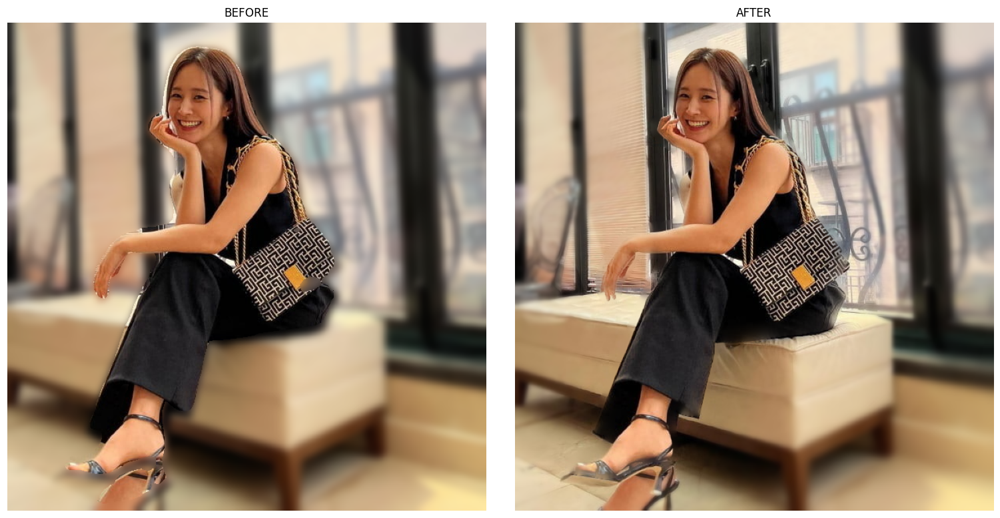

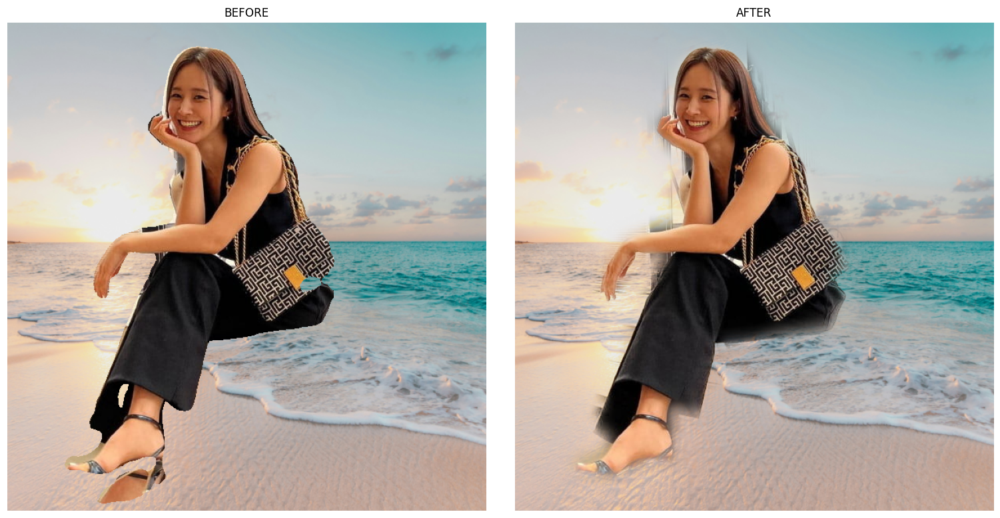

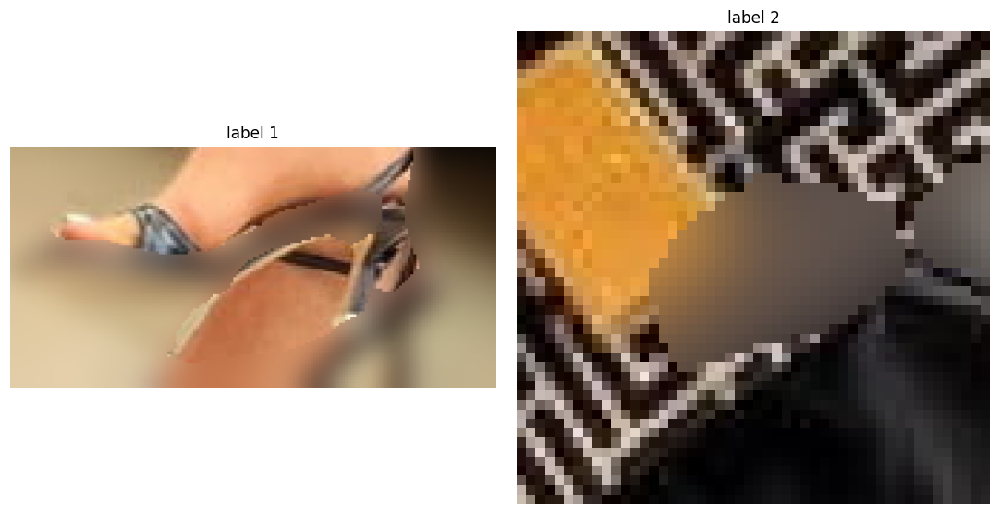

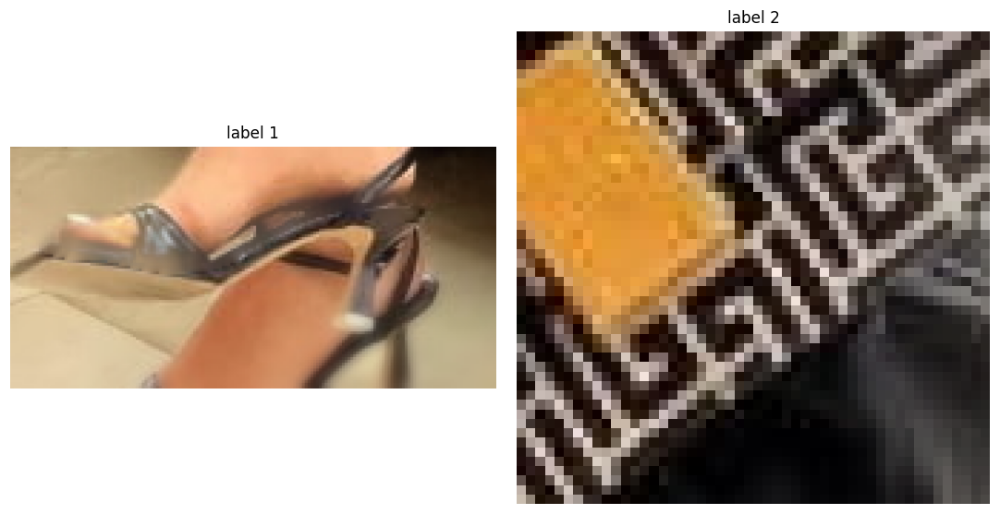

In [54]:
person_v2, alpha_v2 = portrait_mode_v2(person_img, person_mask)
dog_v2, _ = portrait_mode_v2(dog_img, dog_mask)
chroma_v2 = replace_background_v2(person_img, person_mask, bg_img)

save_rgb('05_person_v2.jpg', person_v2)
save_rgb('06_dog_v2.jpg', dog_v2)
save_rgb('07_chroma_v2.jpg', chroma_v2)

show([person_out, person_v2], ['BEFORE', 'AFTER'], cols=2, figsize=(14,7))
show([chroma_out, chroma_v2], ['BEFORE', 'AFTER'], cols=2, figsize=(14,7))
zoom(person_out, PROBLEM_BOXES)
zoom(person_v2, PROBLEM_BOXES)

  오검출 덩어리 1개 제거
  부분투명 픽셀 10.73%
  오검출 덩어리 1개 제거


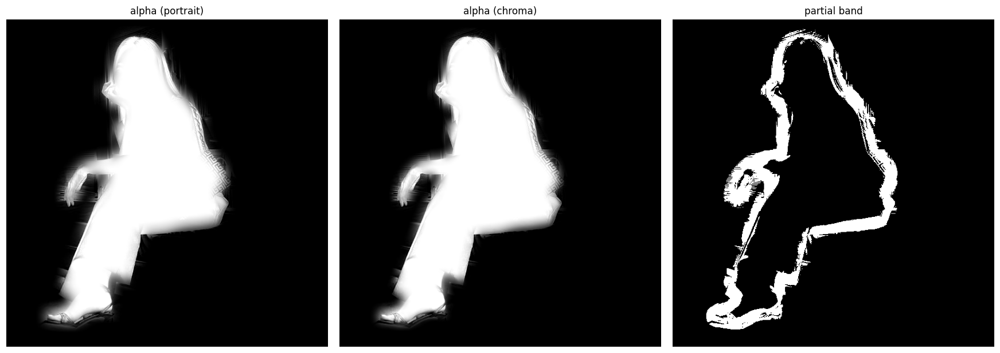

부분투명 픽셀 8.87%


In [55]:
_, alpha_p = portrait_mode_v2(person_img, person_mask)
a_chroma = to_soft_alpha(person_img, clean_mask(person_mask), 20, 1e-4)

show([alpha_p, a_chroma, (a_chroma > 0.05) & (a_chroma < 0.95)],
     ['alpha (portrait)', 'alpha (chroma)', 'partial band'], cols=3, figsize=(16,5.5))
print(f'부분투명 픽셀 {100*np.mean((a_chroma>0.05)&(a_chroma<0.95)):.2f}%')

In [68]:
def clean_mask_matte(mask, open_k=7, close_k=11, min_area_ratio=0.15):
    """크로마키용: fill_holes 없음, closing 약하게 → 진짜 구멍 보존"""
    m = mask.astype(np.uint8)
    m = cv2.morphologyEx(m, cv2.MORPH_OPEN,
                         cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_k, open_k)))
    n, lab, stats, _ = cv2.connectedComponentsWithStats(m, 8)
    if n > 1:
        thr = min_area_ratio * stats[1:, cv2.CC_STAT_AREA].max()
        keep = np.zeros_like(m)
        for i in range(1, n):
            if stats[i, cv2.CC_STAT_AREA] >= thr:
                keep |= (lab == i).astype(np.uint8)
        m = keep
    return cv2.morphologyEx(m, cv2.MORPH_CLOSE,
                            cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_k, close_k)))

def replace_background_v3(img, mask, bg, shrink=2, gf_radius=6, gf_eps=1e-6, gamma=1.6):
    m = clean_mask_matte(mask)
    if shrink:                                   # 경계를 안쪽으로 살짝 당김
        m = cv2.erode(m, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*shrink+1, 2*shrink+1)))
    a = to_soft_alpha(img, m, gf_radius, gf_eps)
    a = np.clip(a, 0, 1) ** gamma                # 중간 알파를 아래로 눌러 후광 축소
    bgf = fit_background(bg, *img.shape[:2]).astype(np.float32)
    out = np.clip(img.astype(np.float32)*a[...,None] + bgf*(1-a[...,None]), 0, 255).astype(np.uint8)
    print(f'  부분투명 픽셀 {100*np.mean((a>0.05)&(a<0.95)):.2f}%')
    return out, a

  부분투명 픽셀 2.89%


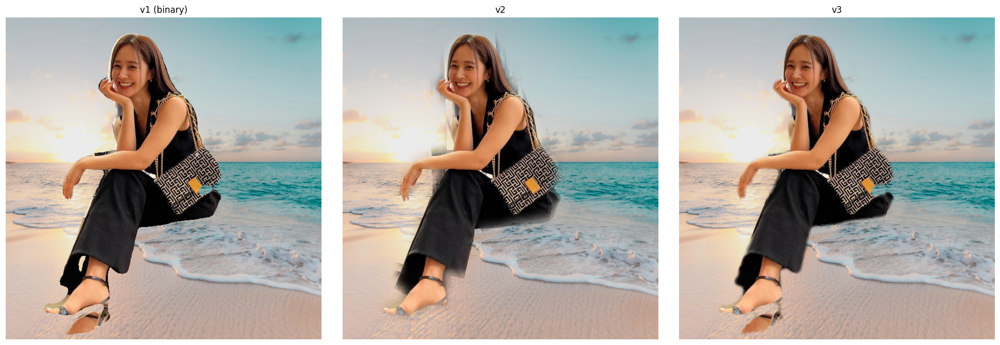

In [69]:
chroma_v3, a3 = replace_background_v3(person_img, person_mask, bg_img)
show([chroma_out, chroma_v2, chroma_v3], ['v1 (binary)', 'v2', 'v3'], cols=3, figsize=(18,6))

In [70]:
def fill_small_holes(mask, max_area_ratio=0.02, verbose=True):
    """테두리에 닿지 않고 충분히 작은 구멍만 메움 — 팔·다리 사이는 보존"""
    m = mask.astype(np.uint8)
    n, lab, stats, _ = cv2.connectedComponentsWithStats(1 - m, 4)
    border = set(lab[0,:]) | set(lab[-1,:]) | set(lab[:,0]) | set(lab[:,-1])
    thr, out, filled = max_area_ratio * m.sum(), m.copy(), 0
    for i in range(1, n):
        if i in border:
            continue
        if stats[i, cv2.CC_STAT_AREA] <= thr:
            out |= (lab == i).astype(np.uint8); filled += 1
    if verbose: print(f'  작은 구멍 {filled}개 메움')
    return out

In [71]:
def replace_background_v3b(img, mask, bg, shrink=2, gf_radius=6, gf_eps=1e-6,
                           gamma=1.6, hole_ratio=0.02):
    m = clean_mask_matte(mask)
    m = fill_small_holes(m, hole_ratio)          # ← 이 줄만 추가
    if shrink:
        m = cv2.erode(m, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*shrink+1, 2*shrink+1)))
    a = np.clip(to_soft_alpha(img, m, gf_radius, gf_eps), 0, 1) ** gamma
    bgf = fit_background(bg, *img.shape[:2]).astype(np.float32)
    out = np.clip(img.astype(np.float32)*a[...,None] + bgf*(1-a[...,None]), 0, 255).astype(np.uint8)
    print(f'  부분투명 픽셀 {100*np.mean((a>0.05)&(a<0.95)):.2f}%')
    return out, a

  작은 구멍 2개 메움
  부분투명 픽셀 2.66%


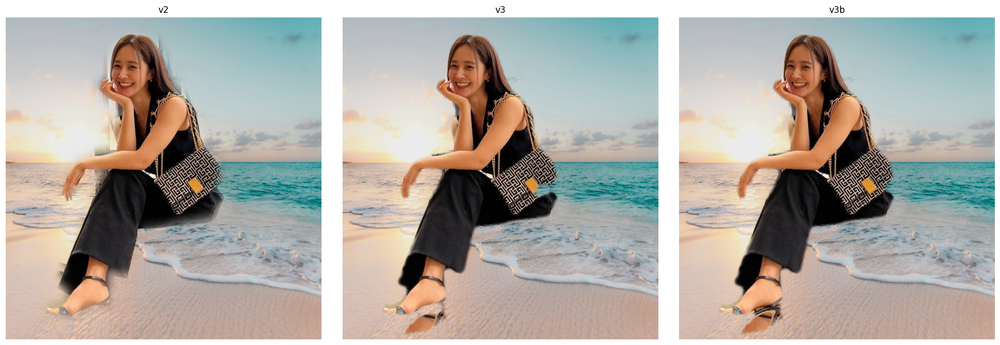

In [72]:
chroma_v3b, a3b = replace_background_v3b(person_img, person_mask, bg_img)
show([chroma_v2, chroma_v3, chroma_v3b], ['v2', 'v3', 'v3b'], cols=3, figsize=(18,6))

## 마스크 오류 보완 솔루션

세그멘테이션 마스크의 오류를 세 유형으로 나누고 각각 대응했다.

**1. 위상 오류 (구멍·오검출 덩어리)**
Opening으로 미세 노이즈를 제거하고, 연결 요소 분석으로 최대 덩어리의 15% 미만인 성분을 삭제했다.
구멍은 무조건 메우면 팔·다리 사이처럼 실제 배경이 보여야 할 영역까지 막히므로, 테두리에 닿지 않고
인물 면적의 2% 이하인 폐영역만 선별해 메웠다. 옷 안쪽 구멍이 좁은 통로로 배경과 이어져 판정에서
빠지는 문제는 Closing 커널을 11로 키워 통로를 먼저 차단해 해결했다.

**2. 경계 계단 현상**
Guided Filter로 이진 마스크를 연속 알파로 변환했다. 단순 블러와 달리 원본 밝기를 안내 신호로 삼아
에지에서는 급격히, 평탄한 곳에서는 완만하게 변하므로 경계가 실제 윤곽에 정렬되고 머리카락 같은
반투명 영역이 표현된다.

**3. 경계 위치 편향**
마스크가 실제 윤곽보다 바깥으로 잡히는 편향은 알파를 부드럽게 해도 남는다. 반경 2px 침식과
감마 보정으로 후광을 억제했다.

**태스크별 분리**
아웃포커싱은 마스크가 틀린 자리에 같은 사진의 흐린 버전이 들어가 오차가 숨지만, 크로마키는 전혀
다른 사진이 들어가 그대로 드러난다. 따라서 아웃포커싱에는 inpainting 배경판 + 점진적 블러를,
크로마키에는 침식과 좁은 필터 반경을 적용해 파이프라인을 나눴다.

**결과**
부분투명 화소 비율 8.87% → 3.09% → 2.66%. 감마 보정이 알파를 전반적으로 낮춰 지표를 불리하게
만들므로 실제 개선폭은 더 크다. 이후로는 침식을 늘리면 발목이 깎이고 반경을 줄이면 머리카락이
경직되는 상충이 나타나 v3b에서 멈췄다. 남은 그림자·조명 불일치는 마스크가 아닌 합성 자체의 한계다.